In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib 
import matplotlib.pyplot as plt
import scanpy as sc
import tabulate
import umap
from importlib import reload

# locals
import utils as ut
reload(ut)

<module 'utils' from '/home/cstansbu/git_repositories/spatial_transcriptomics/clustering/utils.py'>

In [2]:
sc.settings.verbosity = 3 

In [3]:
dirPath = "/nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/scRNAseq/"

adata = {}

for f in os.listdir(dirPath):
    
    if not f == "all":
        cond = f
        mtxPath = f"{dirPath}{f}"
        data = sc.read_10x_mtx(mtxPath, cache=True)
        data.var_names = [x.upper() for x in data.var_names] # uppercase gene names
        adata[cond] = data
    
print("done")

... reading from cache file cache/nfs-turbo-umms-indikar-shared-projects-spatial_transcriptomics-data-scRNAseq-HFD14-matrix.h5ad
... reading from cache file cache/nfs-turbo-umms-indikar-shared-projects-spatial_transcriptomics-data-scRNAseq-ND-matrix.h5ad
... reading from cache file cache/nfs-turbo-umms-indikar-shared-projects-spatial_transcriptomics-data-scRNAseq-HFD8-matrix.h5ad
done


# Filters

In [4]:
min_genes = 500
min_cells = 1

for d, data in adata.items():
    print(d)
    sc.pp.filter_cells(data, min_genes=min_genes)
    sc.pp.filter_genes(data, min_cells=min_cells)
    sc.pp.normalize_total(data, target_sum=1e4) # Normalize each cell by total counts over all genes
    sc.pp.log1p(data) # Logarithmize data via `X = \log(X + 1)`,
    sc.pp.scale(data) # unit variance and zero mean

HFD14
filtered out 710 cells that have less than 500 genes expressed
filtered out 13601 genes that are detected in less than 1 cells
normalizing counts per cell
    finished (0:00:00)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
ND
filtered out 153 cells that have less than 500 genes expressed
filtered out 14003 genes that are detected in less than 1 cells
normalizing counts per cell
    finished (0:00:00)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
HFD8
filtered out 435 cells that have less than 500 genes expressed
filtered out 12902 genes that are detected in less than 1 cells
normalizing counts per cell
    finished (0:00:00)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


# Pooled embedding for vizualization

In [5]:
# # create a common embedding for all cells across all times


# keys = ['ND', 'HFD8', 'HFD14']

# # plotting params
# n_components = 2 # should always be 2
# n_neighbors = 3
# min_dist = 0.1

# # first, get genes present in all three times points
# genesByKey = []
# for i, key in enumerate(keys):
#     data = adata[key]
#     genes = set(data.to_df().columns)
#     genesByKey.append(genes)
    

# commmonGenes = set.intersection(*genesByKey)
# print(f"{len(commmonGenes)} genes at all three times")

# # build a dataframe with all cells
# dfList = []
# indices = {}

# lastInd = 0
# for i, key in enumerate(keys):
#     data = adata[key]
#     df = data.to_df().T
#     indRange = (lastInd, df.shape[1] + lastInd - 1)
#     lastInd += df.shape[1] 
    
#     indices[key] = np.array(range(indRange[0], indRange[1] + 1))
    
#     print(key, df.shape, indRange)
#     df = df[df.index.isin(commmonGenes)]
#     df = df.sort_index(ascending=False)
#     dfList.append(df.T)
    
# X = pd.concat(dfList, axis=0, ignore_index=False)
# X = X.fillna(0) # handle nans introduced by merging
# print(X.shape)

# umap_reducer = umap.UMAP(n_components=n_components,
#                          n_neighbors=n_neighbors,
#                          min_dist=min_dist)

# pooled_embedding = umap_reducer.fit_transform(X) # we need embedding by cell
# pooled_embedding = pd.DataFrame(pooled_embedding)
# pooled_embedding.columns = ['umap1', 'umap2']
# pooled_embedding.head()

# Clustering

In [6]:
# ?sc.tl.leiden
# ?sc.pl.umap
# sc.pp.neighbors

In [7]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 5

# the big choices
n_neighbors = 15
n_pcs = 50
resolution = 0.45

"""The parameter functions as a sort of threshold: communities should have a density of at least γ, 
while the density between communities should be lower than γ. 
Higher resolutions lead to more communities and lower resolutions lead to fewer communities, 
similarly to the resolution parameter for modularity."""

# clustering
for d, data in adata.items():
    
    # 1. project into low-dimensional space
    sc.tl.pca(data, 
              n_comps=n_pcs, 
              svd_solver='arpack')
    
    # 2. build neighborhood graph
    sc.pp.neighbors(data, 
                    n_neighbors=n_neighbors)
    
    # just for visualization purposes 
    sc.tl.umap(data)
    
    # modularity clustering via leiden algorithm
    sc.tl.leiden(data,
                 resolution=resolution)
    
    # break
print('DONE.')

computing PCA
    with n_comps=50
    finished (0:00:03)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)
running Leiden clustering
    finished: found 12 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)
running Leiden clustering
    finished: found 14 clusters and added
    'leiden', the cluster labels (adata.obs, categ

In [8]:
# colorlist = ut.ncolor(3, cmap='viridis')

# for i, key in enumerate(keys):
#     ind = indices[key]
    
#     tdf = pooled_embedding.iloc[ind]
#     plt.scatter(tdf['umap1'],
#                 tdf['umap2'],
#                 s=5,
#                 color=colorlist[i],
#                 alpha=0.4,
#                 label=key, 
#                 zorder=1/(i+1))

# plt.legend()
# plt.xlabel('umap 1')
# plt.ylabel('umap 2')

In [9]:
# # plot clusters using pooled embeddings

# plt.rcParams['figure.dpi'] = 300
# plt.rcParams['figure.figsize'] = 5, 5

# keys = ['ND', 'HFD8', 'HFD14']


# for key in keys:
#     data = adata[key]
    
#     clusterIds = data.obs['leiden'].astype(int).to_numpy()
#     k = data.obs['leiden'].nunique()
#     colorlist = ut.ncolor(k, cmap='viridis')

#     embedding = pooled_embedding.iloc[indices[key]].to_numpy()
    
#     for i in range(k):
        
#         plt.scatter(embedding[clusterIds == i , 0] , 
#                     embedding[clusterIds == i , 1] , 
#                     c=colorlist[i],
#                     edgecolor="None",
#                     s=10,
#                     alpha=0.6,
#                     label=i+1,)
        
#     plt.title(key)
#     plt.legend(bbox_to_anchor=(1.2, 1.025))
#     plt.xlabel("umap 1")
#     plt.ylabel("umap 2")
#     plt.show()

In [10]:
# # plot clusters using individual embeddings
# # shows how well defined the clusters are at a single time point
# plt.rcParams['figure.dpi'] = 300
# plt.rcParams['figure.figsize'] = 5, 5

# keys = ['ND', 'HFD8', 'HFD14']


# for key in keys:
#     data = adata[key]
    
#     clusterIds = data.obs['leiden'].astype(int).to_numpy()
#     k = data.obs['leiden'].nunique()
#     colorlist = ut.ncolor(k, cmap='viridis')

#     embedding = data.obsm['X_umap']

#     for i in range(k):
#         plt.scatter(embedding[clusterIds == i , 0] , 
#                     embedding[clusterIds == i , 1] , 
#                     c=colorlist[i],
#                     edgecolor="None",
#                     s=10,
#                     alpha=0.6,
#                     label=i+1,)
    
#     plt.title(key)
#     plt.legend(bbox_to_anchor=(1.2, 1.025))
#     plt.xlabel("umap 1")
#     plt.ylabel("umap 2")
#     plt.show()

In [11]:
# # plotting clusters
# for d, data in adata.items():
#     sc.tl.umap(data)
#     ax = sc.pl.umap(data, 
#                     color='leiden', 
#                     show=False,
#                     palette='viridis')
#     ax.set_title(d)
    
#     plt.show()
    
#     break

# Score marker genes

## pangloadb

In [12]:
# load gene lists 
pandPath = "/nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/panglaodb/pandb.tsv.gz"        
pandf = ut.read_panglaodb(pandPath)

controlList = [
    # 'Adipocyte progenitor cells', 
    'Adipocytes',
    'B cells', 
    # 'B cells memory', 
    # 'B cells naive',
    'Dendritic cells',
    'Macrophages',
    'Monocytes', 
    # 'Natural killer T cells',
    'NK cells',
    'T cells', 
    # 'T cells naive', 
    # 'T cytotoxic cells',
    # 'T follicular helper cells', 
    # 'T helper cells', 
    # 'T memory cells',
    # 'T regulatory cells', 
]

markerGenes = pandf[pandf['cell type'].isin(controlList)]
print(pd.DataFrame(markerGenes['cell type'].value_counts()))
print()
"""
Ubiquitousness Index (0-1). 
0 indicates the gene is not expressed in any cell cluster and 
1 (maximum) indicates that the gene is expressed in all cell clusters. 
"""
threshold = 0.005

markerGenes = markerGenes[markerGenes['ubiquitousness index'] <= threshold]
print(pd.DataFrame(markerGenes['cell type'].value_counts()))

                 cell type
Macrophages            153
Dendritic cells        133
Adipocytes             120
B cells                110
T cells                107
Monocytes              102
NK cells                98

                 cell type
NK cells                40
Dendritic cells         39
Adipocytes              35
B cells                 27
Macrophages             24
T cells                 18
Monocytes               17


## asuscomm

In [13]:
# asuscommPath = "/nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/asuscomm/markerGenes.txt"
# asuscomm = pd.read_csv(asuscommPath, sep='\t')

# controlList = [
#     'Adipocytes',
#     # 'Adipose progenitor cells',
#     # 'Pro-B cells',
#     # 'Pre-B cells',
#     'Naive B cells',
#     'Memory B cells',
#     'Plasma B cells',
#     'Naive CD8+ T cells',
#     'Naive CD4+ T cells',
#     'Memory CD8+ T cells',
#     'Memory CD4+ T cells',
#     # 'Effector CD8+ T cells',
#     # 'Effector CD4+ T cells',
#     # 'CD8+ NKT-like cells',
#     # 'CD4+ NKT-like cells',
#     'Natural killer cells',
#     'Classical Monocytes',
#     'Non-classical monocytes',
#     'Intermediate monocytes',
#     'Macrophages',
#     # 'Myeloid Dendritic cells',
#     # 'Plasmacytoid Dendritic cells',
# ]

# asuscomm = asuscomm[asuscomm['Cell type'].isin(controlList)]

# newRows = []
# for idx, row in asuscomm.iterrows():
    
#     for gene in row['Marker genes'].split(","):
#         nrow = {
#             'cell type' : row['Cell type'],
#             'gene' : gene.upper(),
#         }
#         newRows.append(nrow)
        


# markerGenes = pd.DataFrame(newRows)
# pd.DataFrame(markerGenes['cell type'].value_counts())

# rank genes

In [14]:
method = 'wilcoxon'
# method = 't-test'

for d, data in adata.items():    
    sc.tl.rank_genes_groups(data, 'leiden', method=method)
    
print("done")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:15)
ranking genes


/home/cstansbu/.local/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:17)
done


In [15]:
geneLists = {}

keys = ['ND', 'HFD8', 'HFD14']

scoreFrame = {}

for key in keys:
    data = adata[key] 
    result = data.uns['rank_genes_groups']
    keys = data.uns['rank_genes_groups'].keys()
    groups = result['names'].dtype.names
    
    newRows = []
    
    for ctype in markerGenes['cell type'].unique():
        ctypeSig = markerGenes[markerGenes['cell type'] == ctype]['gene'].to_list()
        
        for clusterId in groups:
            t = pd.DataFrame(result['names'][clusterId])
            t.columns = ['gene']
            t['scores'] = result['scores'][clusterId]
            t = t.sort_values(by='scores', ascending=False)
            t['rank'] = t['scores'].rank().apply(lambda x: x / len(t)) # normalize rank
        
        
            s = ut.scoreCluster(t[['gene', 'rank']], ctypeSig) # get the score
            
            row = {
                'key' : key,
                'cellType' : ctype,
                'clusterId' : int(clusterId) + 1,
                'score' : s,
            }
            
            newRows.append(row)

    res = pd.DataFrame(newRows)
    scoreFrame[key] = res

print(scoreFrame['ND'].head())

  key    cellType  clusterId     score
0  ND  Adipocytes          1  0.518504
1  ND  Adipocytes          2  0.303299
2  ND  Adipocytes          3  0.719326
3  ND  Adipocytes          4  0.565279
4  ND  Adipocytes          5  0.642287


In [16]:
def cellTypebyMax(df):
    """A function to assign cluster ids to the max score"""
    # df['max_score'] = df.groupby('clusterId')['score'].transform('max')
    
    df = df.sort_values(by=['clusterId', 'score'], ascending=[True, False])
    df = df.drop_duplicates(subset=['clusterId'])
    return df

res = cellTypebyMax(scoreFrame['ND'])
res

,key,cellType,clusterId,score
56,ND,Monocytes,1,0.603284
29,ND,Dendritic cells,2,0.636158
2,ND,Adipocytes,3,0.719326
17,ND,B cells,4,0.956569
74,ND,NK cells,5,0.977478
19,ND,B cells,6,0.422727
62,ND,Monocytes,7,0.698534
35,ND,Dendritic cells,8,0.594238
8,ND,Adipocytes,9,0.774238
93,ND,T cells,10,0.826026


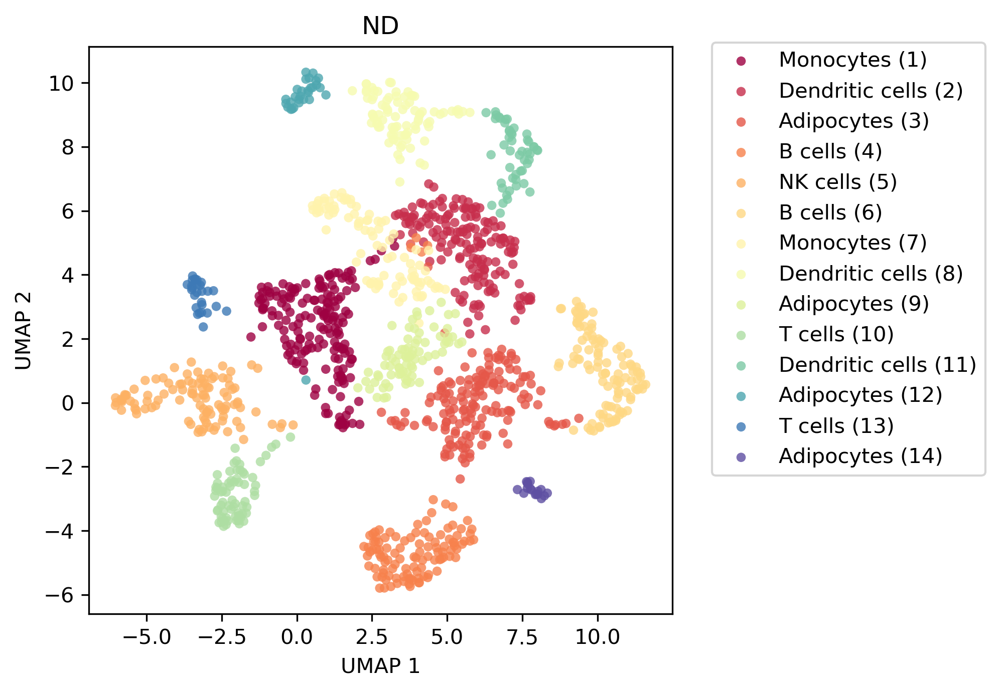

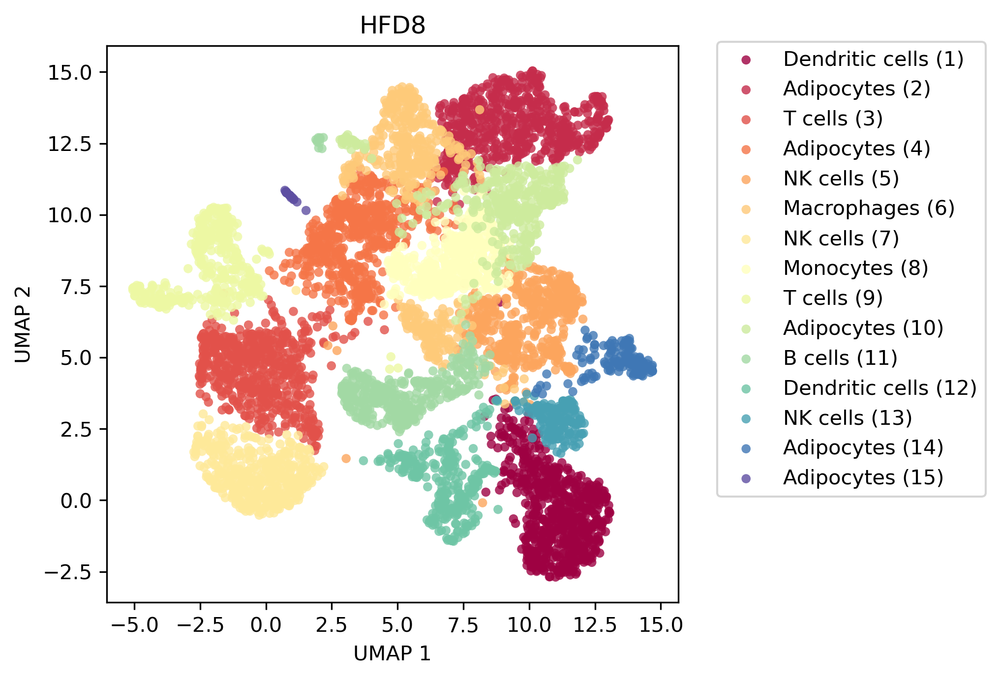

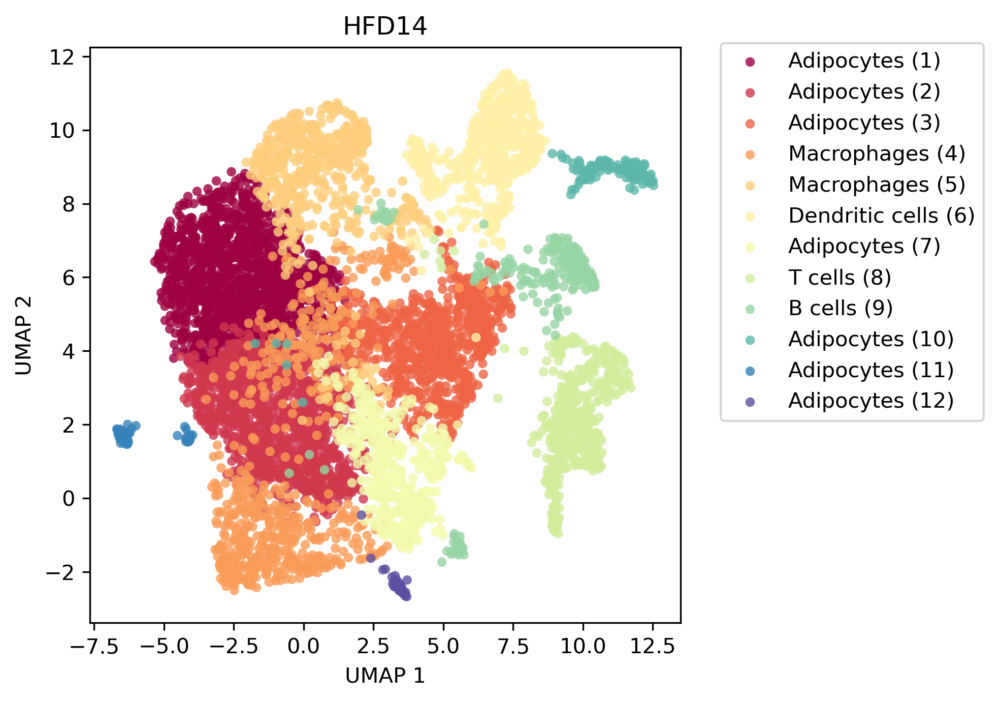

In [17]:
# plot clusters using individual embeddings
# shows how well defined the clusters are at a single time point
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 5

keys = ['ND', 'HFD8', 'HFD14']


for key in keys:
    data = adata[key]
    
    clusterIds = data.obs['leiden'].astype(int).to_numpy()
    cellTypes = cellTypebyMax(scoreFrame[key])
    
    nCellTypes = cellTypes['cellType'].nunique()
    colordict = dict(zip(cellTypes['cellType'].unique(), ut.ncolor(nCellTypes, cmap='viridis')))
    
    k = data.obs['leiden'].nunique()
    colorlist = ut.ncolor(k, cmap='Spectral')
    
    embedding = data.obsm['X_umap']
    

    for i in range(k):
        label = cellTypes[cellTypes['clusterId'] == (i+1)]['cellType'].values[0]
        
        plt.scatter(embedding[clusterIds == i , 0] , 
                    embedding[clusterIds == i , 1] , 
                    c=colorlist[i],
                    edgecolor="None",
                    s=20,
                    alpha=0.8,
                    label=f"{label} ({i+1})",)
    
    plt.title(key)
    plt.legend(bbox_to_anchor=(1.05, 1.025))
    plt.xlabel("UMAP 1")
    plt.ylabel("UMAP 2")
    plt.show()

# Color by cell type

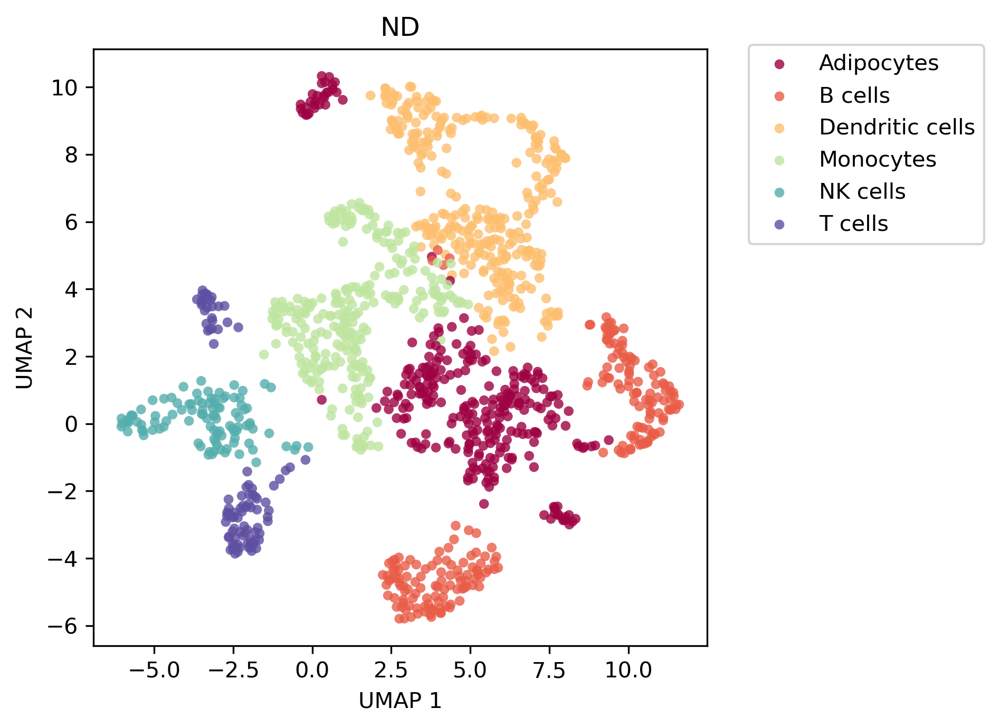

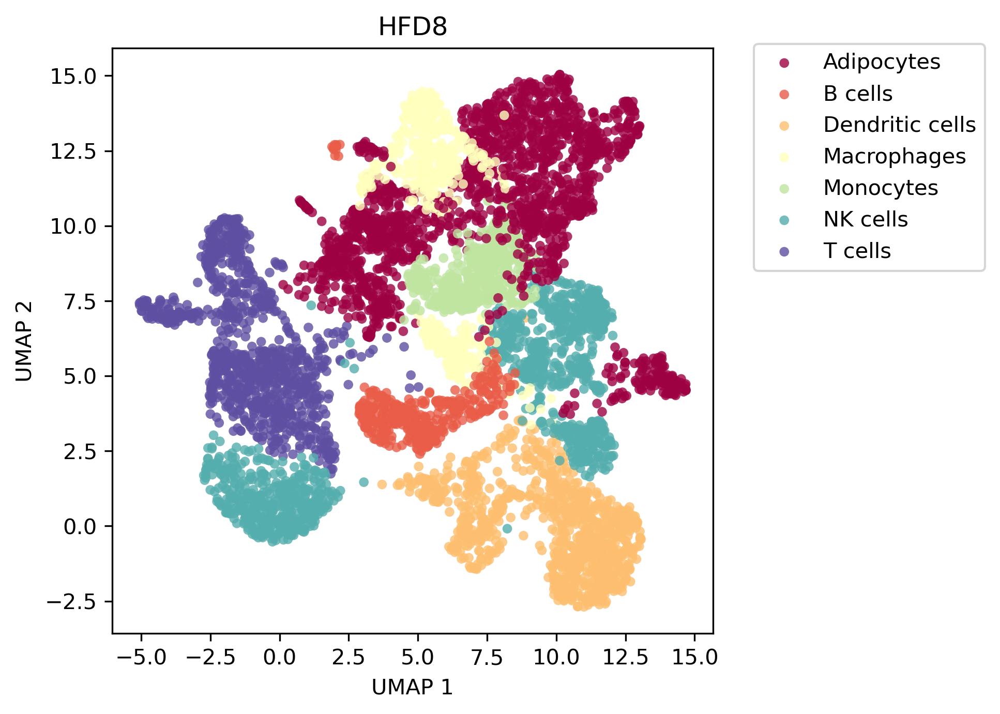

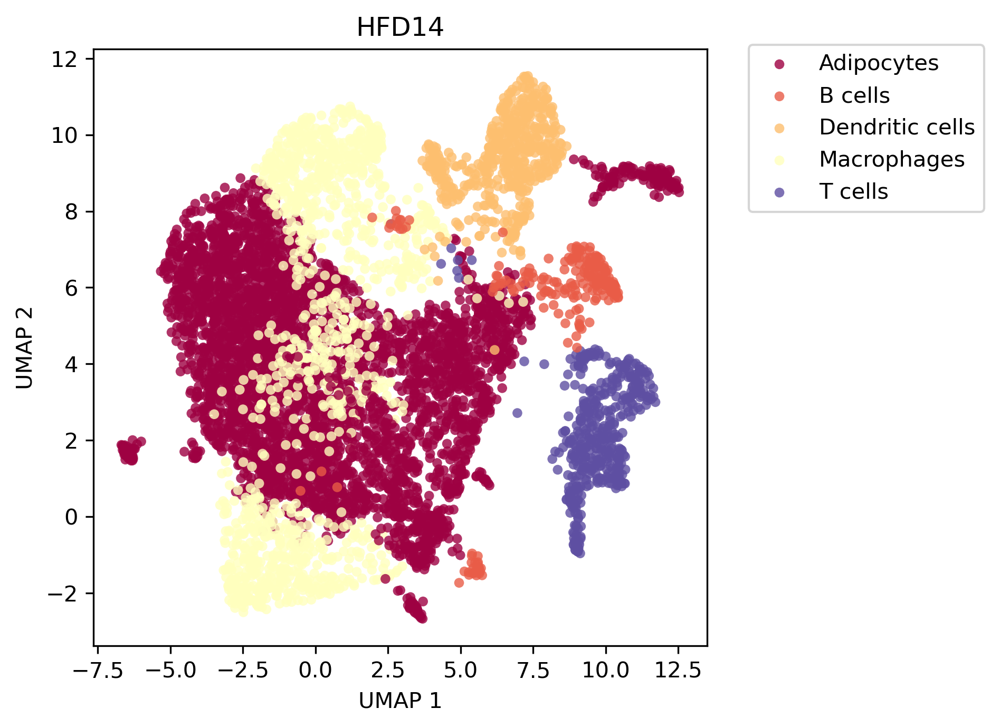

In [18]:
# plot clusters using individual embeddings
# shows how well defined the clusters are at a single time point
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 5

keys = ['ND', 'HFD8', 'HFD14']

ncolors = markerGenes['cell type'].nunique()
ctypes = sorted(markerGenes['cell type'].unique())

colordict = dict(zip(ctypes, ut.ncolor(ncolors, cmap='Spectral')))


for key in keys:
    data = adata[key]
    
    clusterIds = data.obs['leiden'].astype(int).to_numpy()
    cellTypes = cellTypebyMax(scoreFrame[key])
    
    nCellTypes = cellTypes['cellType'].nunique()
    k = data.obs['leiden'].nunique()
    
    embedding = data.obsm['X_umap']
    
    seenlabels = []
    for i in range(k):
        label = cellTypes[cellTypes['clusterId'] == (i+1)]['cellType'].values[0]
        
        if not label in seenlabels:
            seenlabels.append(label)
        
            plt.scatter(embedding[clusterIds == i , 0] , 
                        embedding[clusterIds == i , 1] , 
                        c=colordict[label],
                        edgecolor="None",
                        s=20,
                        alpha=0.8,
                        label=label,)
            
        else:
            plt.scatter(embedding[clusterIds == i , 0] , 
                        embedding[clusterIds == i , 1] , 
                        c=colordict[label],
                        edgecolor="None",
                        s=20,
                        alpha=0.8)
    
    plt.title(key)
    # sort both labels and handles by labels
    handles, labels = plt.gca().get_legend_handles_labels()
    labels, handles = zip(*sorted(zip(labels, handles), key=lambda t: t[0]))
    plt.legend(handles, labels, bbox_to_anchor=(1.05, 1.025))
    plt.xlabel("UMAP 1")
    plt.ylabel("UMAP 2")
    plt.show()

In [19]:
# break

In [20]:
# # plot clusters using individual embeddings
# # shows how well defined the clusters are at a single time point
# plt.rcParams['figure.dpi'] = 300
# plt.rcParams['figure.figsize'] = 5, 5

# keys = ['ND', 'HFD8', 'HFD14']


# ncolors = markerGenes['cell type'].nunique()
# ctypes = sorted(markerGenes['cell type'].unique())

# colordict = dict(zip(ctypes, ut.ncolor(ncolors, cmap='Spectral')))

# for key in keys:
#     data = adata[key]
    
#     clusterIds = data.obs['leiden'].astype(int).to_numpy()
#     cellTypes = cellTypebyMax(scoreFrame[key])
    
#     nCellTypes = cellTypes['cellType'].nunique()
    
#     k = data.obs['leiden'].nunique()
    
#     embedding = pooled_embedding.iloc[indices[key]].to_numpy()
    
#     seenlabels = []
#     for i in range(k):
#         label = cellTypes[cellTypes['clusterId'] == (i+1)]['cellType'].values[0]
        
#         if not label in seenlabels:
#             seenlabels.append(label)
        
#             plt.scatter(embedding[clusterIds == i , 0] , 
#                         embedding[clusterIds == i , 1] , 
#                         c=colordict[label],
#                         edgecolor="None",
#                         s=20,
#                         alpha=0.8,
#                         label=label,)
            
#         else:
#             plt.scatter(embedding[clusterIds == i , 0] , 
#                         embedding[clusterIds == i , 1] , 
#                         c=colordict[label],
#                         edgecolor="None",
#                         s=20,
#                         alpha=0.8)
    
#     plt.title(key)
#     # sort both labels and handles by labels
#     handles, labels = plt.gca().get_legend_handles_labels()
#     labels, handles = zip(*sorted(zip(labels, handles), key=lambda t: t[0]))
#     plt.legend(handles, labels, bbox_to_anchor=(1.05, 1.025))
#     plt.xlabel("UMAP 1")
#     plt.ylabel("UMAP 2")
#     plt.show()

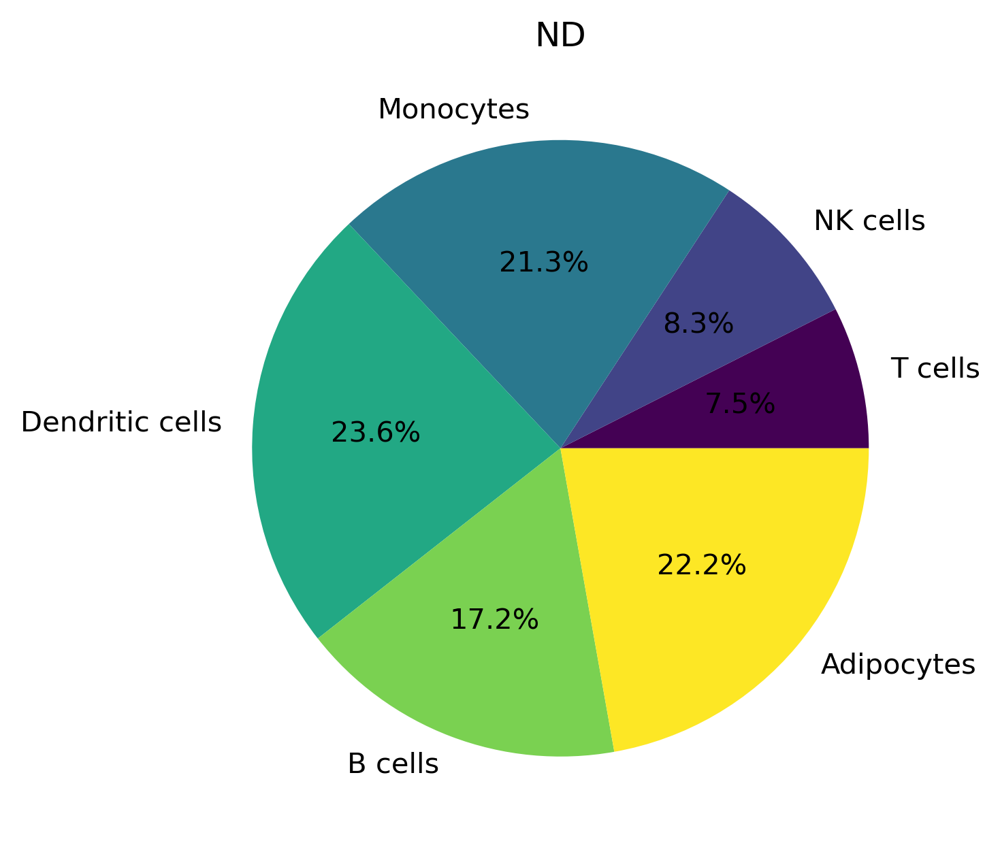

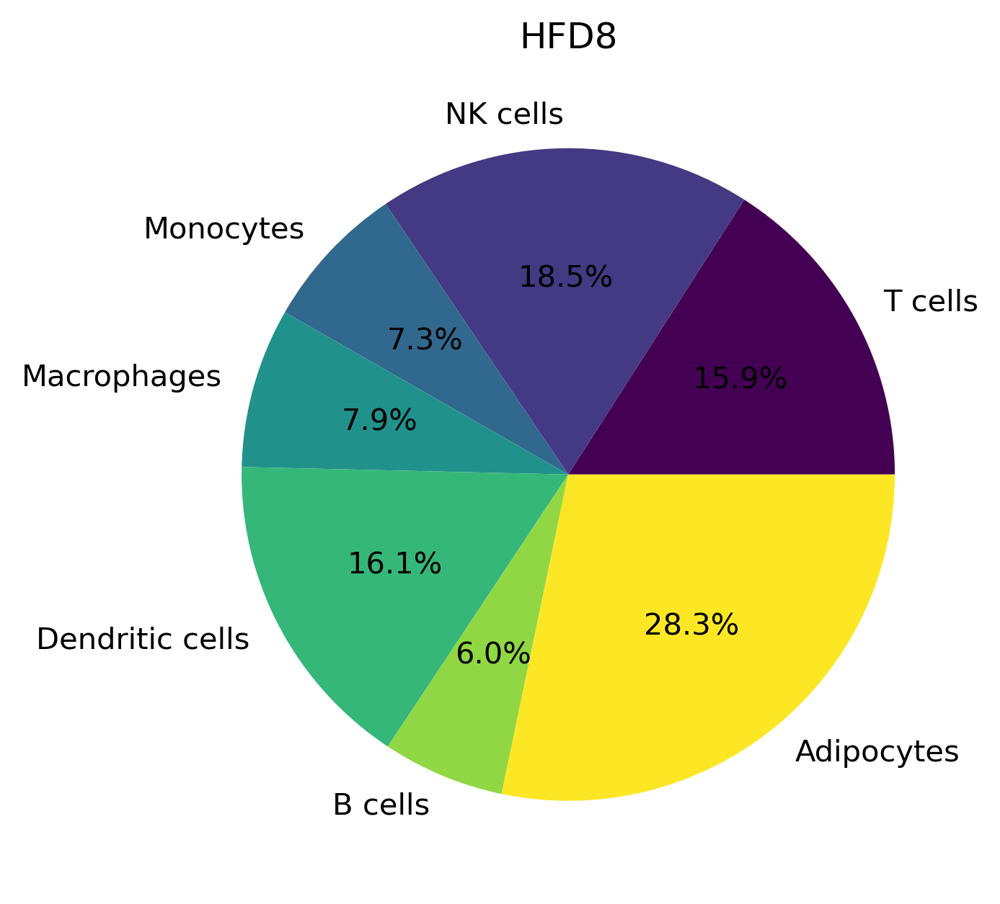

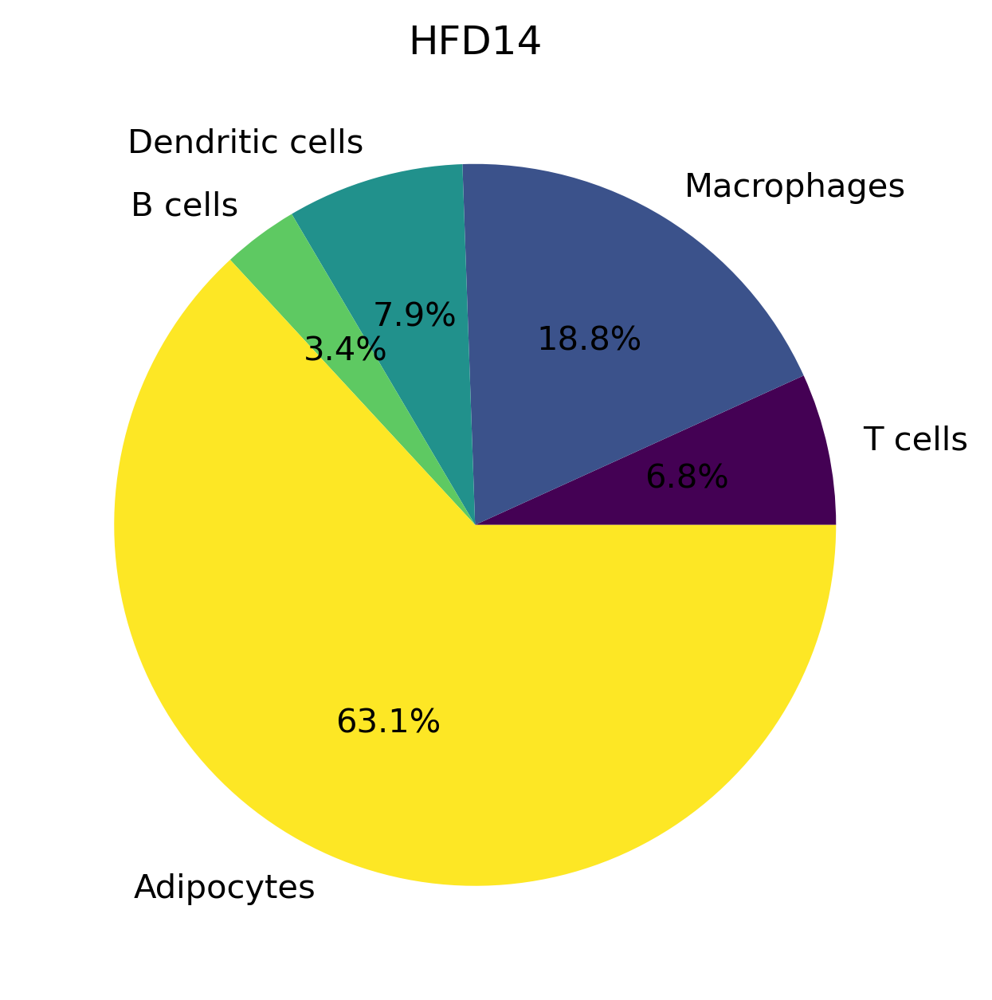

In [21]:
for key in keys:
    data = adata[key]
    
    clusterCount = pd.DataFrame(data.obs['leiden'].astype(int).value_counts(normalize=True))
    clusterCount.columns = ['proportion'] 
    clusterCount['clusterId'] = clusterCount.index + 1
    
    cellTypes = cellTypebyMax(scoreFrame[key])
    cellTypes = pd.merge(cellTypes,
                         clusterCount, 
                         on='clusterId', 
                         how='left')
    
    grped = cellTypes.groupby('cellType')['proportion'].sum()
    grped = grped.sort_index(ascending=False)
    colorlist = ut.ncolor(len(grped), cmap='viridis')
    grped.plot.pie(y='proportion', 
                   colors=colorlist,
                   autopct='%1.1f%%',)
    plt.ylabel("")
    plt.title(key)
    plt.show()

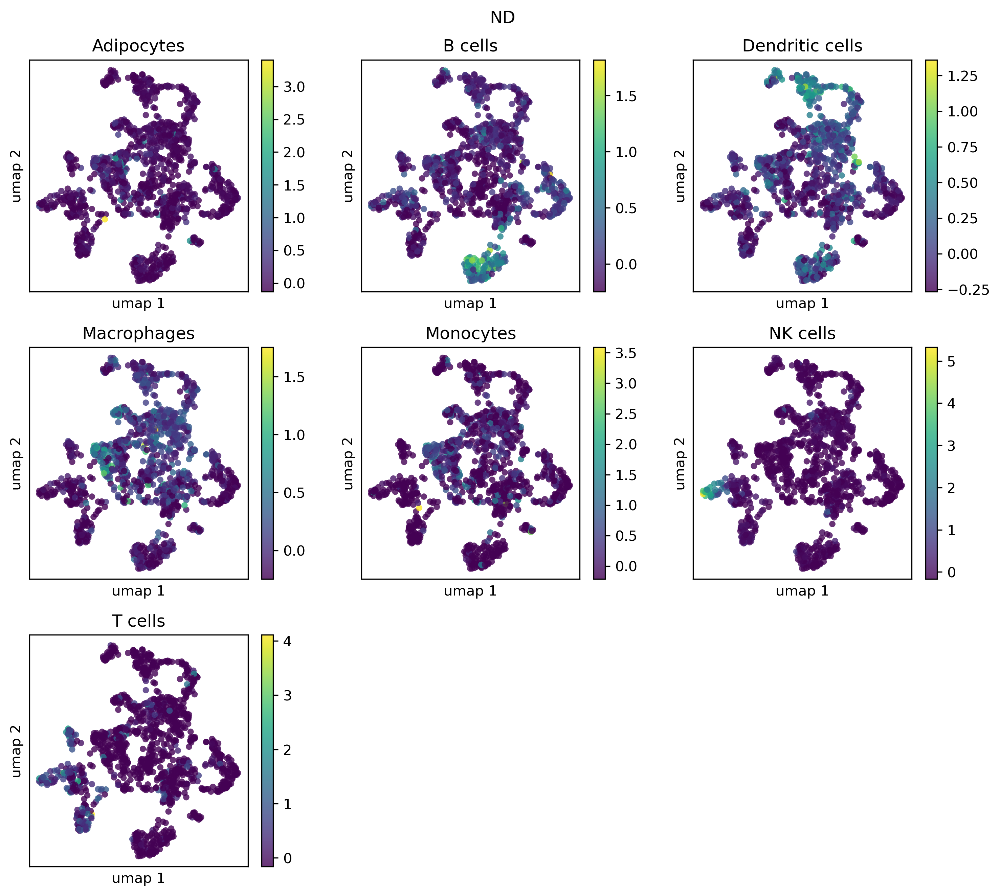

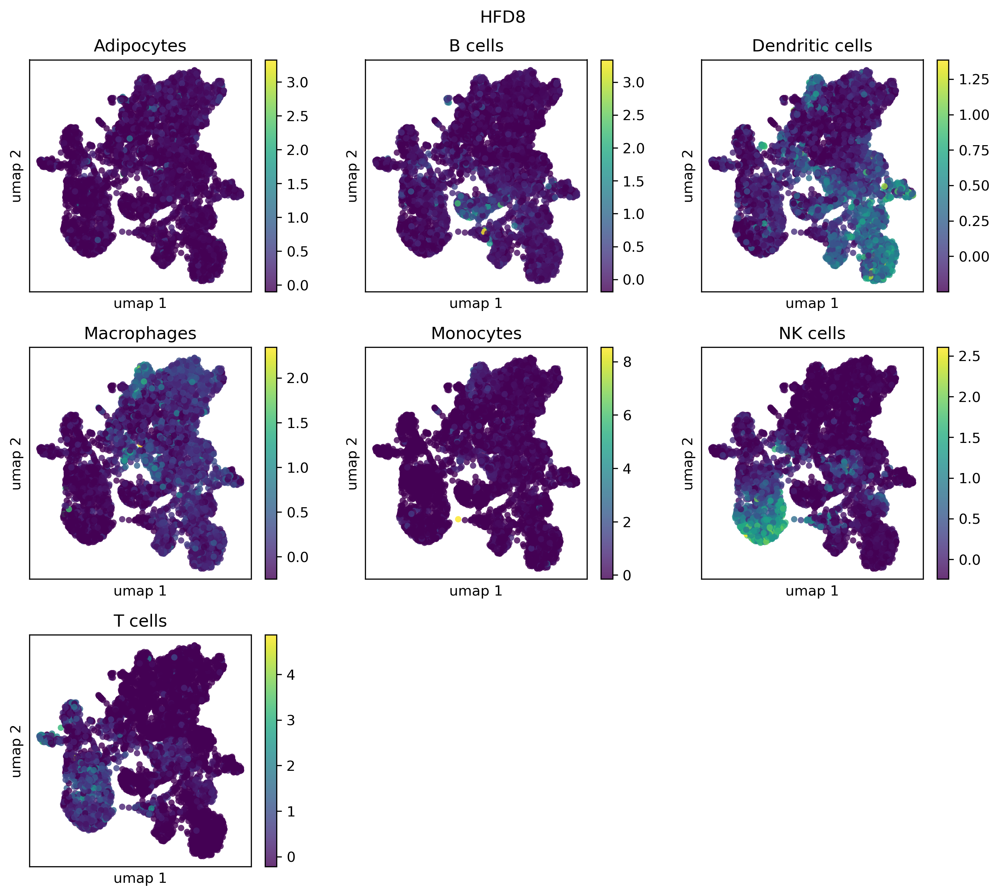

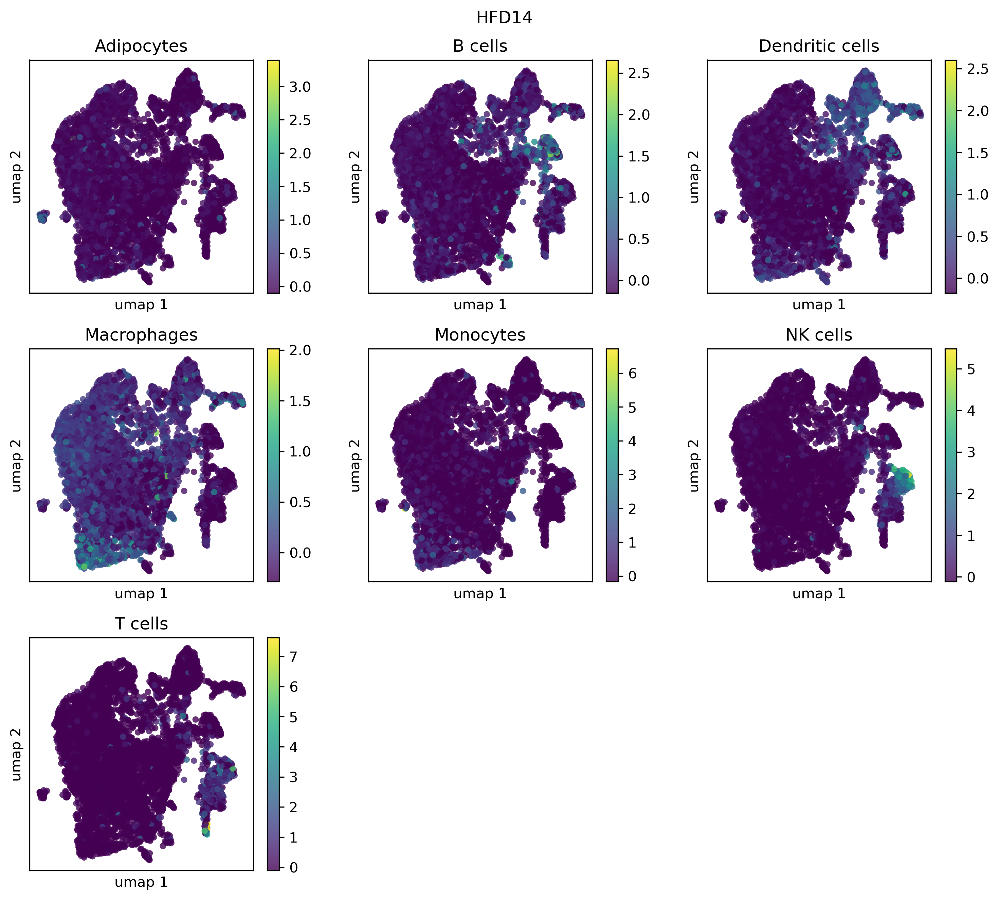

In [22]:
# plot clusters using individual embeddings
# shows how well defined the clusters are at a single time point
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 10, 9

keys = ['ND', 'HFD8', 'HFD14']

def nearest_square(num):
    return int(np.ceil(np.sqrt(num))**2)

for key in keys:
    data = adata[key]
    df = data.to_df()
    embedding = data.obsm['X_umap']
    
    nFig = nearest_square(len(ctype))
    toRemove = int(nFig - len(ctype)) + 1
    
    fig, axs = plt.subplots(int(np.sqrt(nFig)), int(np.sqrt(nFig)))
    axs = axs.ravel()
    
    for i, ctype in enumerate(markerGenes['cell type'].unique()):
        mGenes = markerGenes[markerGenes['cell type'] == ctype]['gene'].to_list()
        intesect = set(df.columns).intersection(set(mGenes))
        
        meanGExp = df[intesect].mean(axis=1).to_list()
        
        p = axs[i].scatter(embedding[: , 0] , 
                       embedding[:, 1] , 
                       c=meanGExp,
                       edgecolor="None",
                       s=20,
                       alpha=0.8)
        
        plt.colorbar(p, ax=axs[i])
        
        axs[i].set_xticks([])
        axs[i].set_yticks([])
        axs[i].set_xlabel('umap 1')
        axs[i].set_ylabel('umap 2')
        axs[i].set_title(ctype)

    plt.suptitle(key)
    plt.tight_layout()
    # clean up the plot
    for k in range(i+1, i+toRemove):
        axs[k].set_axis_off()

    plt.show()
    